# 1. Setup & Install

In [ ]:
!pip install opencv-python

In [1]:
# Import opencv
import cv2

# Import uuid
import uuid

# Import Operating System
import os

# Import time
import time

In [2]:
paths_images = {
    'COLLECTED_IMAGES_PATH' : os.path.join('Tensorflow', 'workspace', 'images', 'collectedimages'),
    'TRAIN_IMAGES_PATH' : os.path.join('Tensorflow', 'workspace', 'images', 'train'),
    'TEST_IMAGES_PATH' : os.path.join('Tensorflow', 'workspace', 'images', 'test')
}

In [3]:
for path in paths_images.values():
    if not os.path.exists(path):
        if os.name == 'posix':
            !mkdir -p {path}
        if os.name == 'nt':
            !mkdir {path}

In [37]:
CUSTOM_MODEL_NAME_LIST = [
    'my_ssd_mobnet',
    'centernet_hg104_512x512',
    'centernet_hg104_1024x1024',
    'centernet_resnet50_v1_fpn_512x512',
    'centernet_resnet101_v1_fpn_512x512',
    'centernet_resnet50_v2_512x512',
    'centernet_mobilenetv2fpn_512x512',
    'efficientdet_d0',
    'efficientdet_d1',
    'efficientdet_d2',
    'efficientdet_d3',
    'efficientdet_d4',
    'efficientdet_d5',
    'efficientdet_d6',
    'efficientdet_d7',
    'ssd_mobilenet_v2_320x320',
    'ssd_mobilenet_v1_fpn_640x640',
    'ssd_mobilenet_v2_fpnlite_320x320',
    'ssd_mobilenet_v2_fpnlite_640x640',
    'ssd_resnet50_v1_fpn_640x640',
    'ssd_resnet50_v1_fpn_1024x1024',
    'ssd_resnet101_v1_fpn_640x640',
    'ssd_resnet101_v1_fpn_1024x1024',
    'ssd_resnet152_v1_fpn_640x640',
    'ssd_resnet152_v1_fpn_1024x1024',
    'faster_rcnn_resnet50_v1_640x640',
    'faster_rcnn_resnet50_v1_1024x1024',
    'faster_rcnn_resnet50_v1_800x1333',
    'faster_rcnn_resnet101_v1_640x640',
    'faster_rcnn_resnet101_v1_1024x1024',
    'faster_rcnn_resnet101_v1_800x1333',
    'faster_rcnn_resnet152_v1_640x640',
    'faster_rcnn_resnet152_v1_1024x1024',
    'faster_rcnn_resnet152_v1_800x1333',
    'faster_rcnn_inception_resnet_v2_640x640',
    'faster_rcnn_inception_resnet_v2_1024x1024'
]
for i in range(0,len(CUSTOM_MODEL_NAME_LIST)):
  print(f'{i}:{CUSTOM_MODEL_NAME_LIST[i]}')

0:my_ssd_mobnet
1:centernet_hg104_512x512
2:centernet_hg104_1024x1024
3:centernet_resnet50_v1_fpn_512x512
4:centernet_resnet101_v1_fpn_512x512
5:centernet_resnet50_v2_512x512
6:centernet_mobilenetv2fpn_512x512
7:efficientdet_d0
8:efficientdet_d1
9:efficientdet_d2
10:efficientdet_d3
11:efficientdet_d4
12:efficientdet_d5
13:efficientdet_d6
14:efficientdet_d7
15:ssd_mobilenet_v2_320x320
16:ssd_mobilenet_v1_fpn_640x640
17:ssd_mobilenet_v2_fpnlite_320x320
18:ssd_mobilenet_v2_fpnlite_640x640
19:ssd_resnet50_v1_fpn_640x640
20:ssd_resnet50_v1_fpn_1024x1024
21:ssd_resnet101_v1_fpn_640x640
22:ssd_resnet101_v1_fpn_1024x1024
23:ssd_resnet152_v1_fpn_640x640
24:ssd_resnet152_v1_fpn_1024x1024
25:faster_rcnn_resnet50_v1_640x640
26:faster_rcnn_resnet50_v1_1024x1024
27:faster_rcnn_resnet50_v1_800x1333
28:faster_rcnn_resnet101_v1_640x640
29:faster_rcnn_resnet101_v1_1024x1024
30:faster_rcnn_resnet101_v1_800x1333
31:faster_rcnn_resnet152_v1_640x640
32:faster_rcnn_resnet152_v1_1024x1024
33:faster_rcnn_resne

In [38]:
PRETRAINED_MODEL_NAME_LIST = [
    'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
    'centernet_hg104_512x512_coco17_tpu-8',
    'centernet_hg104_1024x1024_coco17_tpu-32',
    'centernet_resnet50_v1_fpn_512x512_coco17_tpu-8',
    'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8',
    'centernet_resnet50_v2_512x512_coco17_tpu-8',
    'centernet_mobilenetv2fpn_512x512_coco17_od',
    'efficientdet_d0_coco17_tpu-32',
    'efficientdet_d1_coco17_tpu-32',
    'efficientdet_d2_coco17_tpu-32',
    'efficientdet_d3_coco17_tpu-32',
    'efficientdet_d4_coco17_tpu-32',
    'efficientdet_d5_coco17_tpu-32',
    'efficientdet_d6_coco17_tpu-32',
    'efficientdet_d7_coco17_tpu-32',
    'ssd_mobilenet_v2_320x320_coco17_tpu-8',
    'ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8',
    'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
    'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8',
    'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8',
    'ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8',
    'ssd_resnet101_v1_fpn_640x640_coco17_tpu-8',
    'ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8',
    'ssd_resnet152_v1_fpn_640x640_coco17_tpu-8',
    'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8',
    'faster_rcnn_resnet50_v1_640x640_coco17_tpu-8',
    'faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8',
    'faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8',
    'faster_rcnn_resnet101_v1_640x640_coco17_tpu-8',
    'faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8',
    'faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8',
    'faster_rcnn_resnet152_v1_640x640_coco17_tpu-8',
    'faster_rcnn_resnet152_v1_1024x1024_coco17_tpu-8',
    'faster_rcnn_resnet152_v1_800x1333_coco17_gpu-8',
    'faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8',
    'faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8',
]

In [39]:
PRETRAINED_MODEL_URL_LIST = [
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200713/centernet_hg104_512x512_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200713/centernet_hg104_1024x1024_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v1_fpn_512x512_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet101_v1_fpn_512x512_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_resnet50_v2_512x512_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20210210/centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d1_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d3_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d4_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d5_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d6_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d7_coco17_tpu-32.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet152_v1_fpn_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet152_v1_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet152_v1_1024x1024_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet152_v1_800x1333_coco17_gpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8.tar.gz',
    'http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.tar.gz',
]

In [75]:
i=35
CUSTOM_MODEL_NAME =  CUSTOM_MODEL_NAME_LIST[i]
PRETRAINED_MODEL_NAME = PRETRAINED_MODEL_NAME_LIST[i]
PRETRAINED_MODEL_URL = PRETRAINED_MODEL_URL_LIST[i]
TF_RECORD_SCRIPT_NAME = 'generate_tfrecord.py'
LABEL_MAP_NAME = 'label_map.pbtxt'
CUSTOM_MODEL_NAME

'faster_rcnn_inception_resnet_v2_1024x1024'

In [76]:
paths = {
    'WORKSPACE_PATH': os.path.join('Tensorflow', 'workspace'),
    'SCRIPTS_PATH': os.path.join('Tensorflow','scripts'),
    'APIMODEL_PATH': os.path.join('Tensorflow','models'),
    'ANNOTATION_PATH': os.path.join('Tensorflow', 'workspace','annotations'),
    'IMAGE_PATH': os.path.join('Tensorflow', 'workspace','images'),
    'MODEL_PATH': os.path.join('Tensorflow', 'workspace','models'),
    'PRETRAINED_MODEL_PATH': os.path.join('Tensorflow', 'workspace','pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME),
    'OUTPUT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'export'),
    'TFJS_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfjsexport'),
    'TFLITE_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfliteexport'),
    'PROTOC_PATH':os.path.join('Tensorflow','protoc')
 }

In [96]:
files = {
    'PIPELINE_CONFIG':os.path.join('Tensorflow', 'workspace','models', CUSTOM_MODEL_NAME, 'pipeline.config'),
    'TF_RECORD_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], TF_RECORD_SCRIPT_NAME),
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
}

In [78]:
for path in paths.values():
    if not os.path.exists(path):
        if os.name == 'posix':
            !mkdir -p {path}
        if os.name == 'nt':
            !mkdir {path}

In [44]:
if os.name=='nt':
    !pip install wget
    import wget

In [ ]:
!pip install protobuf matplotlib

In [ ]:
!pip install pyyaml

In [ ]:
if not os.path.exists(os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['APIMODEL_PATH']}

In [ ]:
# Install Tensorflow Object Detection
if os.name=='posix':
    !apt-get install protobuf-compiler
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .

if os.name=='nt':
    url="https://github.com/protocolbuffers/protobuf/releases/download/v3.15.6/protoc-3.15.6-win64.zip"
    wget.download(url)
    !move protoc-3.15.6-win64.zip {paths['PROTOC_PATH']}
    !cd {paths['PROTOC_PATH']} && tar -xf protoc-3.15.6-win64.zip
    os.environ['PATH'] += os.pathsep + os.path.abspath(os.path.join(paths['PROTOC_PATH'], 'bin'))
    !cd Tensorflow/models/research && protoc object_detection/protos/*.proto --python_out=. && copy object_detection\\packages\\tf2\\setup.py setup.py && python setup.py build && python setup.py install
    !cd Tensorflow/models/research/slim && pip install -e .

In [ ]:
!pip uninstall tensorflow -y
!pip install tensorflow==2.13

In [ ]:
VERIFICATION_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'builders', 'model_builder_tf2_test.py')
# Verify Installation
!python {VERIFICATION_SCRIPT}

In [16]:
import object_detection

In [45]:
if os.name =='posix':
    !wget {PRETRAINED_MODEL_URL}
    !mv {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}
if os.name == 'nt':
    wget.download(PRETRAINED_MODEL_URL)
    !move {PRETRAINED_MODEL_NAME+'.tar.gz'} {paths['PRETRAINED_MODEL_PATH']}
    !cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}

--2023-12-13 17:08:08--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.118.207, 74.125.200.207, 74.125.130.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.118.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 447961769 (427M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.tar.gz’

faster_rcnn_incepti 100%[===================>] 427.21M  24.2MB/s    in 19s     

2023-12-13 17:08:27 (23.0 MB/s) - ‘faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8.tar.gz’ saved [447961769/447961769]

faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/
faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/checkpoint/
faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_inception_resnet_v2_1024x10

# 2. Create Label Map

In [79]:
labels = [{'name':'person', 'id':1}, {'name':'sports ball', 'id':2}]

with open(files['LABELMAP'], 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

In [36]:
import shutil

folder_path = '/content/Tensorflow/workspace/models/faster_rcnn_inception_resnet_v2_1024x1024'

# Remove the folder
shutil.rmtree(folder_path)

In [50]:
import xml.etree.ElementTree as ET
folder_path = '/content/Tensorflow/workspace/images/test'

for filename in os.listdir(folder_path):
    if not filename.endswith('.xml'):
        continue

    full_path = os.path.join(folder_path, filename)
    tree = ET.parse(full_path)
    root = tree.getroot()

    for object in root.findall('object'):
        name = object.find('name')
        if name.text == 'sport ball':
            name.text = 'sports ball'

    tree.write(full_path)


# 3. Create TF records

In [ ]:
# OPTIONAL IF RUNNING ON COLAB
ARCHIVE_FILES = os.path.join(paths['IMAGE_PATH'], 'archive.tar.gz')
if os.path.exists(ARCHIVE_FILES):
  !tar -zxvf {ARCHIVE_FILES}

In [19]:
if not os.path.exists(files['TF_RECORD_SCRIPT']):
    !git clone https://github.com/nicknochnack/GenerateTFRecord {paths['SCRIPTS_PATH']}

In [ ]:
!pip install pytz

In [51]:
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'train')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'train.record')}
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'test')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'test.record')}

Successfully created the TFRecord file: Tensorflow/workspace/annotations/train.record
Successfully created the TFRecord file: Tensorflow/workspace/annotations/test.record


# 4. Copy Model Config to Training Folder

In [52]:
if os.name =='posix':
    !cp {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}
if os.name == 'nt':
    !copy {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}

# 5. Update Config For Transfer Learning

In [53]:
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

In [54]:
config = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])

In [55]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, pipeline_config)

In [56]:
pipeline_config.model.faster_rcnn.num_classes = len(labels)
pipeline_config.train_config.batch_size = 2
pipeline_config.train_config.fine_tune_checkpoint = os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'checkpoint', 'ckpt-0')
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= files['LABELMAP']
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'train.record')]
pipeline_config.eval_input_reader[0].label_map_path = files['LABELMAP']
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'test.record')]

In [57]:
config_text = text_format.MessageToString(pipeline_config)
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "wb") as f:
    f.write(config_text)

# 6. Train the model

In [58]:
!pip install gin-config

In [127]:
TRAINING_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'model_main_tf2.py')

In [128]:
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=20000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])

In [129]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/faster_rcnn_inception_resnet_v2_1024x1024 --pipeline_config_path=Tensorflow/workspace/models/faster_rcnn_inception_resnet_v2_1024x1024/pipeline.config --num_train_steps=20000


In [ ]:
!{command}

2023-12-13 18:45:09.819331: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1213 18:45:09.820958 139441368040576 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 20000
I1213 18:45:09.844178 139441368040576 config_util.py:552] Maybe overwriting train_steps: 20000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1213 18:45:09.844349 139441368040576 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W1213 18:45:09.883622 139441368040576 deprecation.py:364] From /usr/local/lib/python3.10/dist-packages/object_detection/model_lib_v2.py:563: StrategyBase.experimen

In [114]:
!apt-get install tensorrt
!pip install nvidia-pyindex
!pip install nvidia-tensorrt

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  cuda-cccl-12-1 cuda-cccl-12-3 cuda-cudart-12-1 cuda-cudart-12-3 cuda-cudart-dev-12-1
  cuda-cudart-dev-12-3 cuda-driver-dev-12-1 cuda-driver-dev-12-3 cuda-nvcc-12-1
  cuda-toolkit-12-1-config-common cuda-toolkit-12-3-config-common cuda-toolkit-12-config-common
  libcublas-12-3 libcublas-dev-12-3 libnvinfer-bin libnvinfer-dev libnvinfer-dispatch-dev
  libnvinfer-dispatch8 libnvinfer-headers-dev libnvinfer-headers-plugin-dev libnvinfer-lean-dev
  libnvinfer-lean8 libnvinfer-plugin-dev libnvinfer-plugin8 libnvinfer-samples
  libnvinfer-vc-plugin-dev libnvinfer-vc-plugin8 libnvinfer8 libnvonnxparsers-dev libnvonnxparsers8
  libnvparsers-dev libnvparsers8
The following NEW packages will be installed:
  cuda-cccl-12-1 cuda-cccl-12-3 cuda-cudart-12-1 cuda-cudart-12-3 cuda-cudart-dev-12-1
  cuda-cudart-dev-12-3 cuda-driver-dev-12-1 cuda-driver-

# 7. Evaluate the Model

In [102]:
command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={}".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'])

In [ ]:
!{command}

# 8. Load Train Model From Checkpoint

In [63]:
import os
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

In [124]:
configs = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
detection_model = model_builder.build(model_config=configs['model'], is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)

# Load the latest checkpoint
latest_ckpt = tf.train.latest_checkpoint(paths['CHECKPOINT_PATH'])
if latest_ckpt:
    ckpt.restore(latest_ckpt).expect_partial()
    print(f"Checkpoint loaded: {latest_ckpt}")
else:
    raise FileNotFoundError("No checkpoint found in", paths['CHECKPOINT_PATH'])

@tf.function
def detect_fn(image):
    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)
    return detections

Checkpoint loaded: Tensorflow/workspace/models/faster_rcnn_inception_resnet_v2_1024x1024/ckpt-3


In [125]:
model='/content/Tensorflow/workspace/pre-trained-models/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8'
configs2 = config_util.get_configs_from_pipeline_file(os.path.join('Tensorflow', 'workspace','pre-trained-models', model, 'pipeline.config'))
detection_model2 = model_builder.build(model_config=configs2['model'], is_training=False)

# Restore checkpoint
ckpt2 = tf.compat.v2.train.Checkpoint(model=detection_model2)

# Load the latest checkpoint
latest_ckpt2 = tf.train.latest_checkpoint(os.path.join('Tensorflow', 'workspace','pre-trained-models',model,'checkpoint'))
if latest_ckpt2:
    ckpt2.restore(latest_ckpt2).expect_partial()
    print(f"Checkpoint loaded: {latest_ckpt2}")
else:
    raise FileNotFoundError("No checkpoint found in", paths['CHECKPOINT_PATH'])

@tf.function
def detect_fn_0(image):
    image, shapes = detection_model2.preprocess(image)
    prediction_dict = detection_model2.predict(image, shapes)
    detections = detection_model2.postprocess(prediction_dict, shapes)
    return detections

Checkpoint loaded: /content/Tensorflow/workspace/pre-trained-models/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/checkpoint/ckpt-0


# 9. Detect from an Image

In [89]:
import cv2
from PIL import Image
from google.colab import files as colab_files
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [66]:
category_index = label_map_util.create_category_index_from_labelmap(files['LABELMAP'])

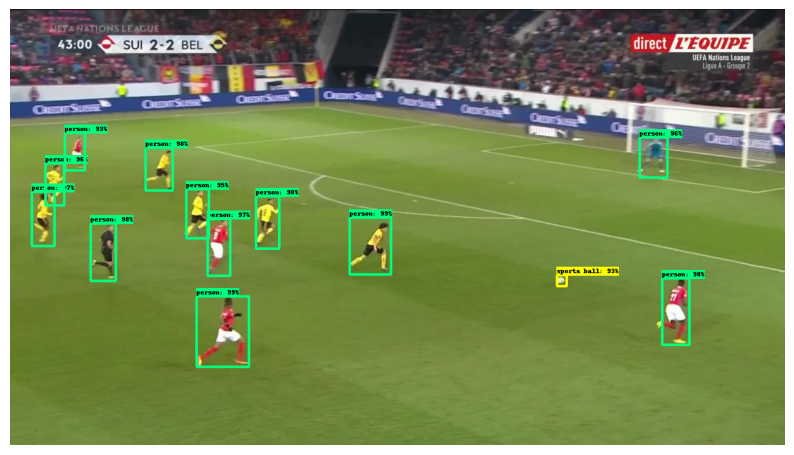

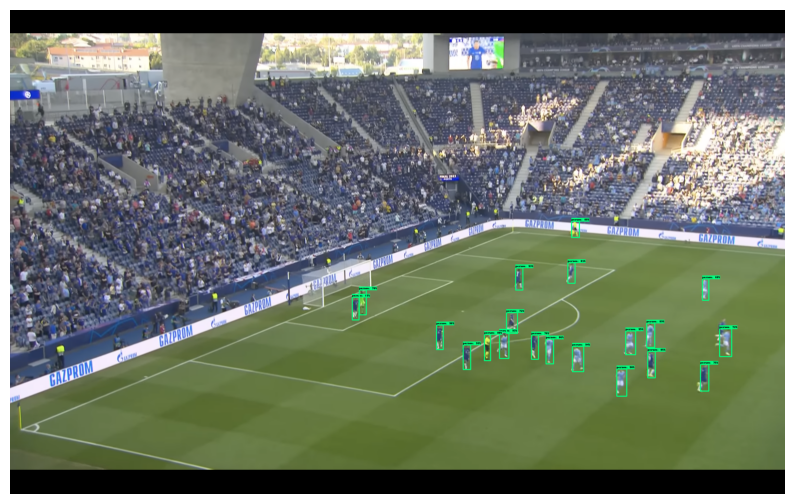

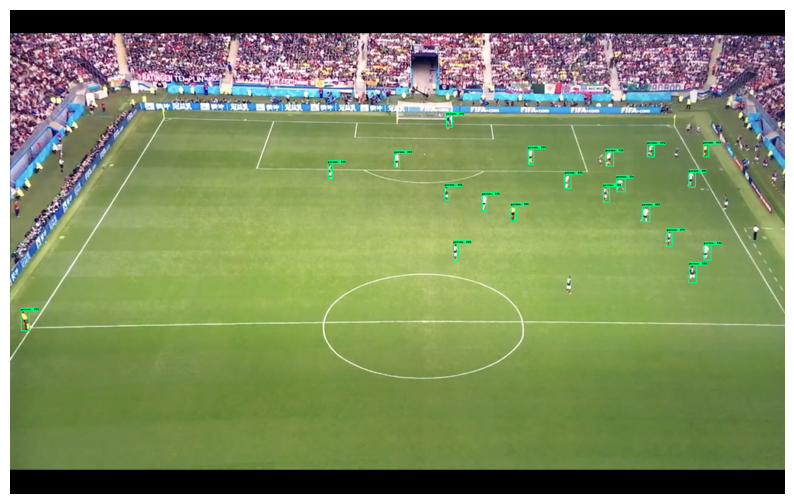

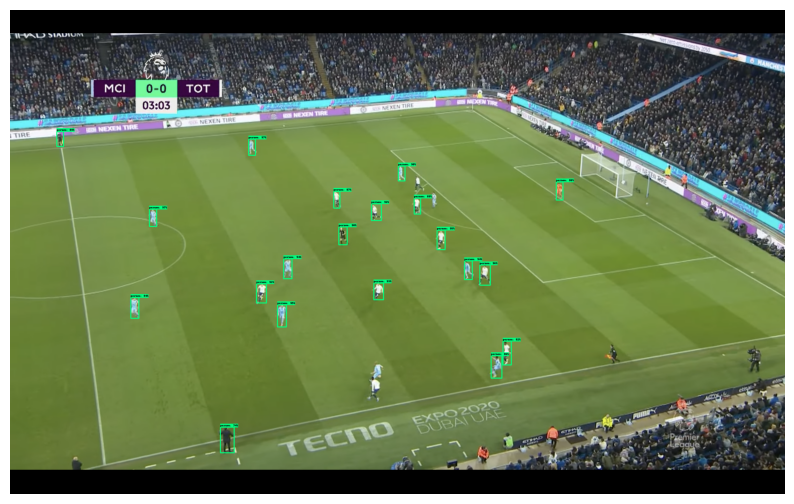

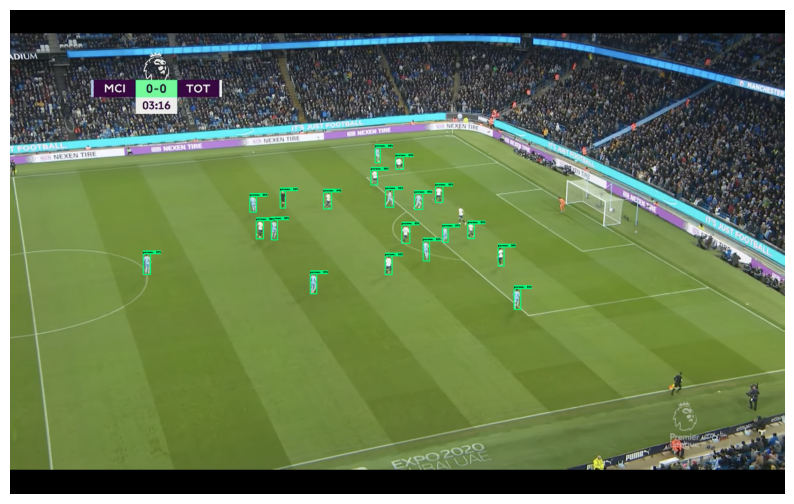

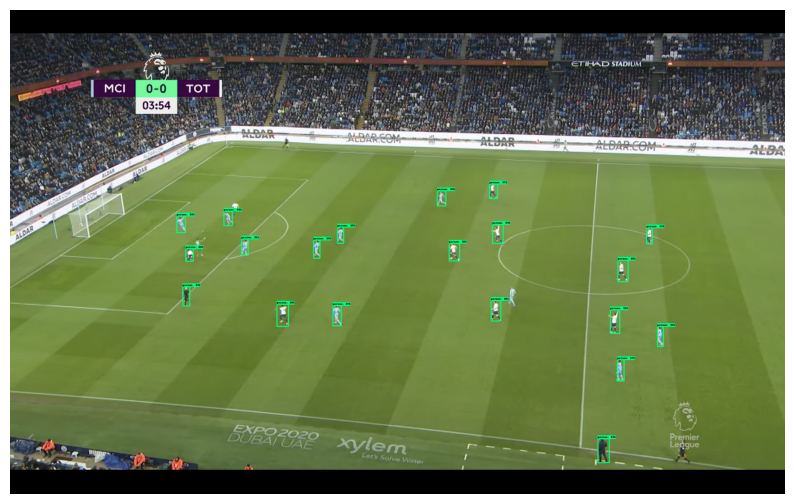

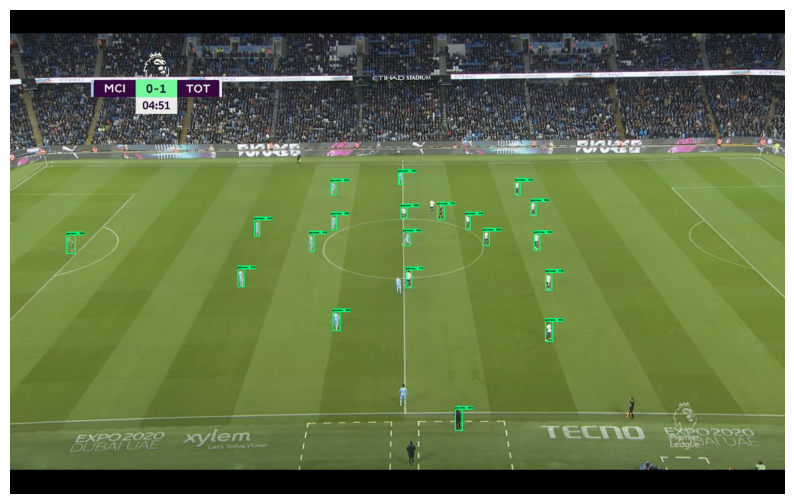

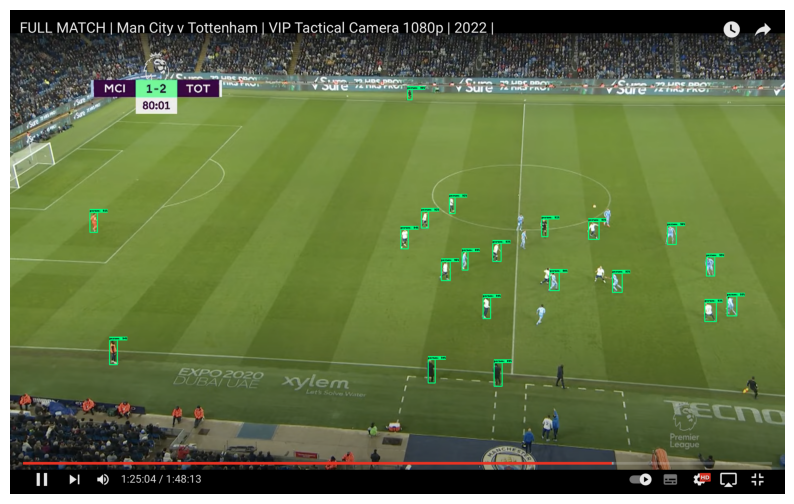

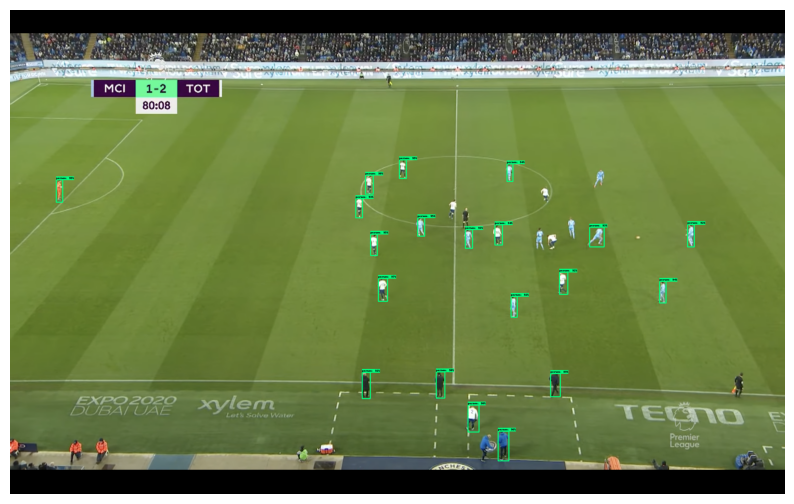

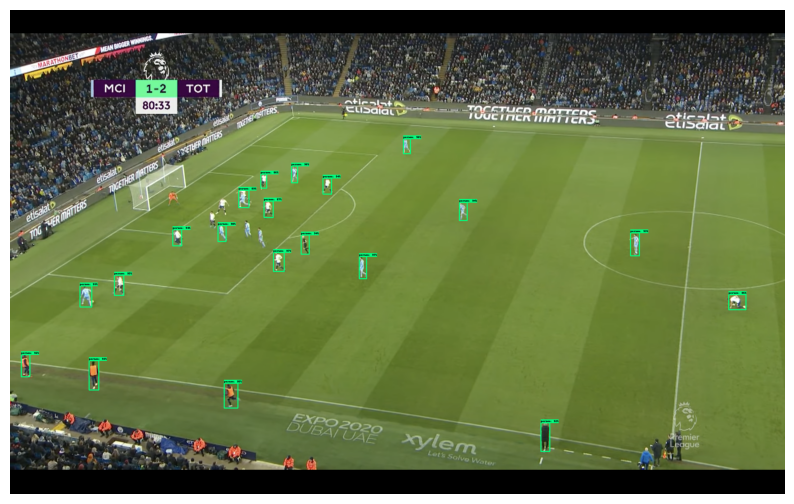

KeyboardInterrupt: ignored

In [123]:
folder_path = '/content/Tensorflow/workspace/images/test'

files_ = sorted([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
current=1
for i in range(0, len(files_), 2):
  IMAGE_PATH = os.path.join(folder_path, files_[i])
  img = cv2.imread(IMAGE_PATH)
  image_np = np.array(img)

  input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
  detections = detect_fn(input_tensor)
  num_detections = int(detections.pop('num_detections'))
  detections = {key: value[0, :num_detections].numpy()
                for key, value in detections.items()}
  detections['num_detections'] = num_detections

  # detection_classes should be ints.
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
              image_np_with_detections,
              detections['detection_boxes'],
              detections['detection_classes']+label_id_offset,
              detections['detection_scores'],
              category_index,
              use_normalized_coordinates=True,
              min_score_thresh=.6,
              agnostic_mode=False)
  plt.figure(figsize=(10, 10))
  plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()

  file_path = f'/content/Tensorflow/workspace/images/collectedimages/image{current}.png'

  cv2.imwrite(file_path, image_np_with_detections)

  current+=1

In [ ]:
folder_path = '/content/Tensorflow/workspace/images/collectedimages'

zip_path = '/content/resultimages.zip'

# Compress the folder
!zip -r {zip_path} {folder_path}

# Check if the zip file was created
if os.path.exists(zip_path):
    # Download the zip file
    colab_files.download(zip_path)
else:
    print("Zip file was not created.")

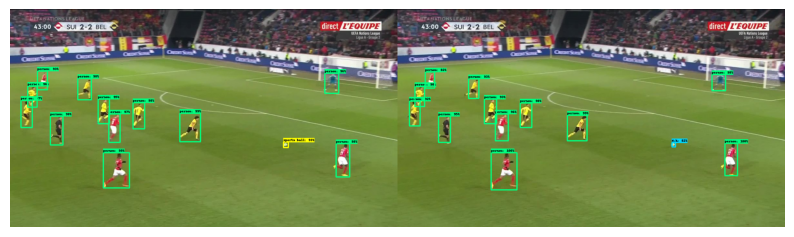

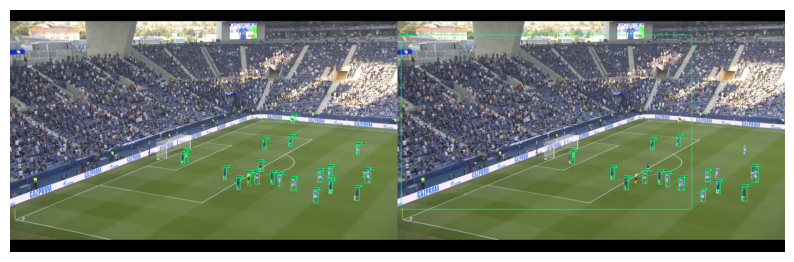

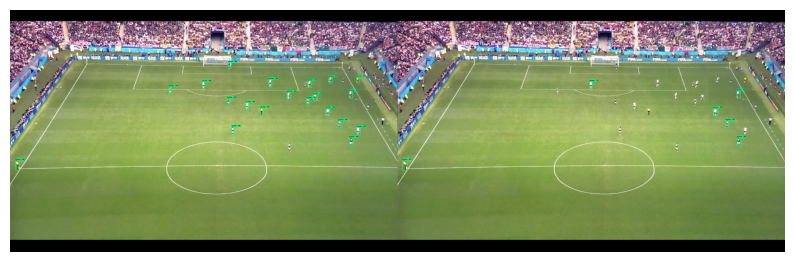

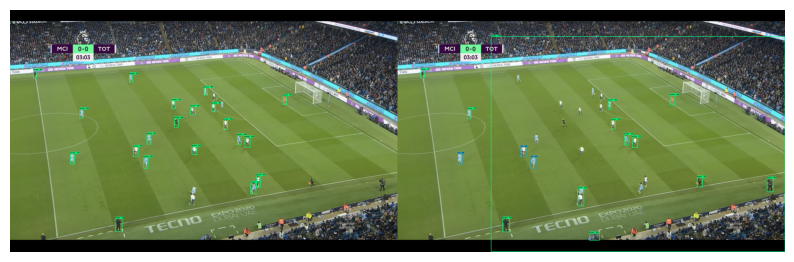

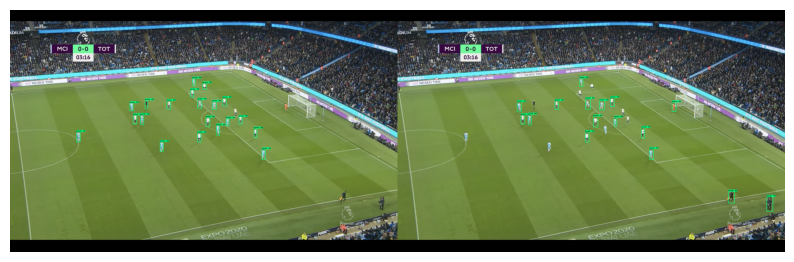

...

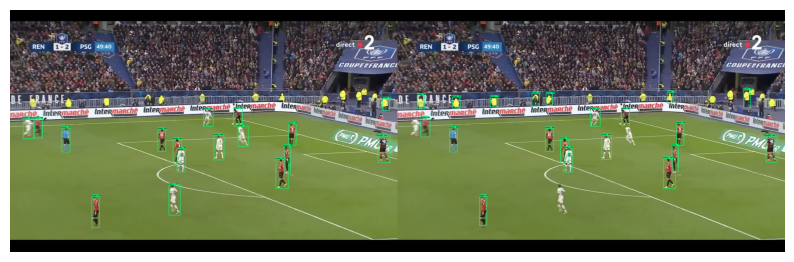

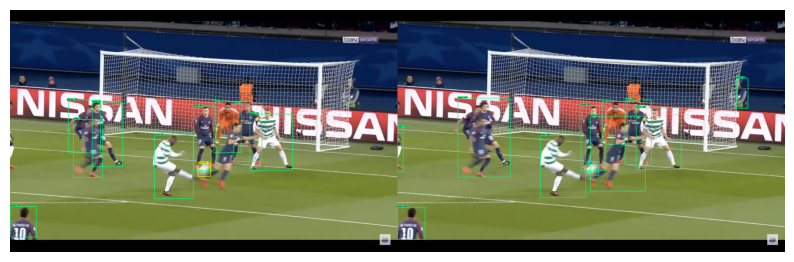

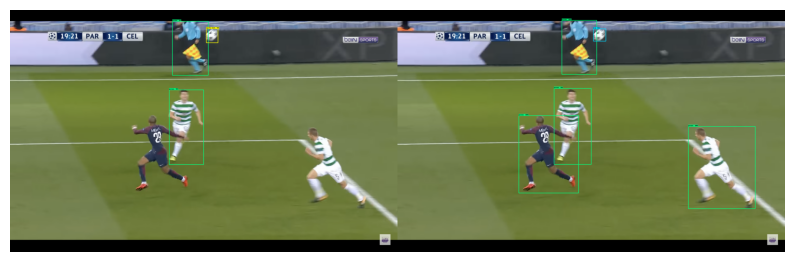

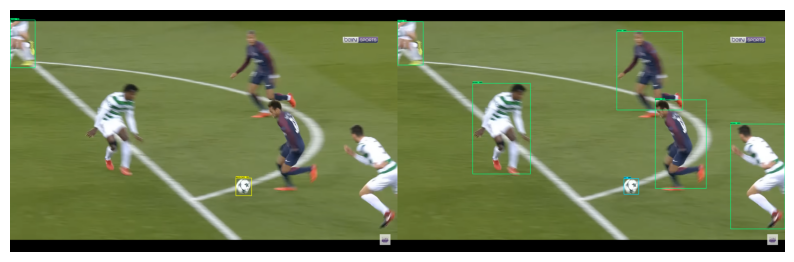

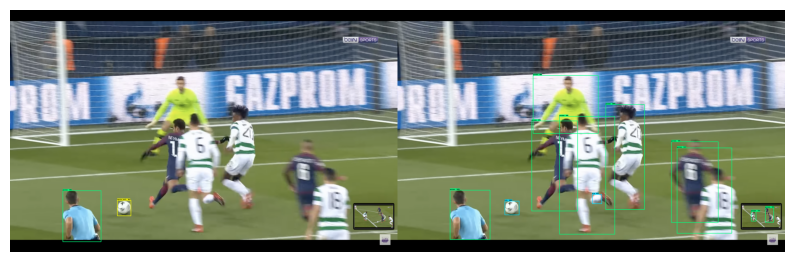

KeyboardInterrupt: ignored

In [126]:
folder_path = '/content/Tensorflow/workspace/images/test'

files_ = sorted([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
current=1
for i in range(0, len(files_), 2):
  IMAGE_PATH = os.path.join(folder_path, files_[i])
  img = cv2.imread(IMAGE_PATH)
  image_np = np.array(img)

  input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
  detections = detect_fn(input_tensor)
  num_detections = int(detections.pop('num_detections'))
  detections = {key: value[0, :num_detections].numpy()
                for key, value in detections.items()}
  detections['num_detections'] = num_detections

  # detection_classes should be ints.
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
              image_np_with_detections,
              detections['detection_boxes'],
              detections['detection_classes']+label_id_offset,
              detections['detection_scores'],
              category_index,
              use_normalized_coordinates=True,
              min_score_thresh=.6,
              agnostic_mode=False)


  detections2 = detect_fn_0(input_tensor)
  num_detections2 = int(detections2.pop('num_detections'))
  detections2 = {key: value[0, :num_detections2].numpy()
                for key, value in detections2.items()}
  detections2['num_detections'] = num_detections2

  # detection_classes should be ints.
  detections2['detection_classes'] = detections2['detection_classes'].astype(np.int64)

  label_id_offset = 1
  image_np_with_detections2 = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
              image_np_with_detections2,
              detections2['detection_boxes'],
              detections2['detection_classes']+label_id_offset,
              detections2['detection_scores'],
              category_index,
              use_normalized_coordinates=True,
              min_score_thresh=.6,
              agnostic_mode=False)



  img=np.hstack([image_np_with_detections , image_np_with_detections2])
  plt.figure(figsize=(10, 10))
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()



# 10. Freezing the Graph

In [ ]:
FREEZE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'exporter_main_v2.py ')

In [ ]:
command = "python {} --input_type=image_tensor --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(FREEZE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['OUTPUT_PATH'])

In [ ]:
print(command)

In [ ]:
!{command}

# 11. Zip and Export Models

In [ ]:
!tar -czf models.tar.gz {paths['CHECKPOINT_PATH']}

In [ ]:
from google.colab import drive
drive.mount('/content/drive')